### Check data

#### load test file

In [1]:
import json
json_file_path = './test_files.json'

# read test json file
with open(json_file_path) as f:
    test_data = json.load(f)

# # filter norm test data
test_files = [f for f in test_data if '*img.tif' in f]

In [2]:
# Define a function to recursively search for matching strings

import json
import fnmatch
def find_matching_strings(obj, pattern):
    matches = []
    if isinstance(obj, dict):
        for key, value in obj.items():
            matches.extend(find_matching_strings(value, pattern))
    elif isinstance(obj, list):
        for item in obj:
            matches.extend(find_matching_strings(item, pattern))
    elif isinstance(obj, str):
        if fnmatch.fnmatch(obj, pattern):
            matches.append(obj)
    return matches

# Define the pattern to match
pattern = '*img.tif'

# Find all matching strings in the JSON data
matching_strings = find_matching_strings(test_data, pattern)

In [3]:
test_id = [item.split('_')[0] for item in matching_strings]
test_id = sorted(test_id, key=int)

In [4]:
import pickle
with open('./shuffle_model.pkl', 'rb') as f:
    shuffle_model = pickle.load(f)

#### Check whether the saved image aligns with original image shuffle order

In [5]:
# you need to change path to your pkl path
with open('./cellpose_nonorm_all.pkl', 'rb') as f:
    cellpose_data = pickle.load(f)


In [6]:
with open('./stardist_all.pkl', 'rb') as f:
    stardist_data = pickle.load(f)

In [7]:
with open('./swin2d.pkl', 'rb') as f:
    swin2d_predict = pickle.load(f)

In [8]:
with open('./swin3d_win3.pkl', 'rb') as f:
    swin_3D_pretrain_window3_predict = pickle.load(f)

In [9]:
models_map = {
    1:cellpose_data,
    2:stardist_data,
    3:swin2d_predict,
    4:swin_3D_pretrain_window3_predict
}

In [10]:
import tiffile as tf
import numpy as np
for img_id in test_id:
    model1_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model1.tif')
    model2_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model2.tif')
    model3_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model3.tif')
    model4_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model4.tif')
    model_ori1 = models_map[shuffle_model[img_id][0]][img_id]
    model_ori2 = models_map[shuffle_model[img_id][1]][img_id]
    model_ori3 = models_map[shuffle_model[img_id][2]][img_id]
    model_ori4 = models_map[shuffle_model[img_id][3]][img_id]
    are_equal1 = np.array_equal(model1_img, model_ori1)
    are_equal2 = np.array_equal(model2_img, model_ori2)
    are_equal3 = np.array_equal(model3_img, model_ori3)
    are_equal4 = np.array_equal(model4_img, model_ori4)
    if are_equal1 and are_equal2 and are_equal3 and are_equal4:
        print(img_id, 'same')
    

0024 same
0084 same


In [11]:
models_name = {
    1:'cellpose',
    2:'stardist',
    3:'swin2d',
    4:'swin_3d_pretrain_win3'
}

In [77]:
import matplotlib.pyplot as plt 
# Create a PdfPages object to save the figures
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('model_check.pdf') as pdf:
    for img_id in test_id:
        model1_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model1.tif')
        model2_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model2.tif')
        model3_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model3.tif')
        model4_img = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model4.tif')
        model1_name = models_name[shuffle_model[img_id][0]]
        model2_name = models_name[shuffle_model[img_id][1]]
        model3_name = models_name[shuffle_model[img_id][2]]
        model4_name = models_name[shuffle_model[img_id][3]]
        model_ori1 = models_map[shuffle_model[img_id][0]][img_id]
        model_ori2 = models_map[shuffle_model[img_id][1]][img_id]
        model_ori3 = models_map[shuffle_model[img_id][2]][img_id]
        model_ori4 = models_map[shuffle_model[img_id][3]][img_id]
        
        fig, ax = plt.subplots(2, 4, figsize=(20, 10))
        
        # Display the images
        ax[0][0].imshow(model1_img>0)
        ax[0][1].imshow(model2_img>0)
        ax[0][2].imshow(model3_img>0)
        ax[0][3].imshow(model4_img>0)

        ax[1][0].imshow(model_ori1)
        ax[1][1].imshow(model_ori2)
        ax[1][2].imshow(model_ori3)
        ax[1][3].imshow(model_ori4)
       
        # Set titles for each subplot
        ax[0][0].set_title(f'{img_id} Model 1({model1_name})')
        ax[0][1].set_title(f'{img_id} Model 2({model2_name})')
        ax[0][2].set_title(f'{img_id} Model 3({model3_name})')
        ax[0][3].set_title(f'{img_id} Model 4({model4_name})')
        
        # Adjust layout
        plt.tight_layout()
        
        # Save the current figure into the PDF
        pdf.savefig(fig)
        
        # Close the figure to free memory
        plt.close(fig)

print("PDF saved successfully.")


PDF saved successfully.


In [14]:
with open('./val_train.pkl', 'rb') as f:
    val_train_df = pickle.load(f)

In [16]:
id_list = val_train_df['ID'].astype(str).tolist()

In [18]:
id_list.index('0109')

18

In [20]:
import matplotlib.pyplot as plt 
# Create a PdfPages object to save the figures
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('model_tatz_annotation.pdf') as pdf:
   for img_id in id_list[:19]:
            
        model_img = [ tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model1.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model2.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model3.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model4.tif')]
        
        mask = tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/tatz_annotation/{img_id}_mask.tif')

        ##### change order
        cellpose = model_img[shuffle_model[img_id].index(1)]
        stardist = model_img[shuffle_model[img_id].index(2)]
        swin2d = model_img[shuffle_model[img_id].index(3)]
        swin3d_win3 = model_img[shuffle_model[img_id].index(4)]
        
        fig, ax = plt.subplots(1, 5, figsize=(25, 5))
        
        # Display the images
        ax[0].imshow(cellpose>0)
        ax[1].imshow(stardist>0)
        ax[2].imshow(swin2d>0)
        ax[3].imshow(swin3d_win3>0)
        ax[4].imshow(mask>0)

       
        # Set titles for each subplot
        ax[0].set_title(f'{img_id} cellpose ')
        ax[1].set_title(f'{img_id} stardist')
        ax[2].set_title(f'{img_id} swin2d')
        ax[3].set_title(f'{img_id} swin3d_win3')
        ax[4].set_title(f'{img_id} Tatz annotate')
        # Adjust layout
        plt.tight_layout()
        
        # Save the current figure into the PDF
        pdf.savefig(fig)
        
        # Close the figure to free memory
        plt.close(fig)

print("PDF saved successfully.")

PDF saved successfully.


In [78]:
with open('/mnt/aperto/mxia/Tatz_annotations/models_select/model_select.pkl', 'rb') as f:
    model_select_data = pickle.load(f)

In [79]:
selected_columns = model_select_data[['ID','model_rank', 'comments']]
selected_columns

,ID,model_rank,comments
5,0005,rank1: model3,Model 3 missed some but the best overall. Mode...
6,0006,rank1: model2,Model 2 detect well dim cells and can separate...
9,0009,rank1: model4,Model 4 looks great. Model 3 missed a cell whi...
17,0017,rank1: model1,Even the best model 1 missed dim cell. Model 2...
22,0022,rank1: model4,"Though best, model 4 missed some dim cells. Mo..."
24,0024,All same,No positive cells in the image. All models cor...
30,0030,rank1: model 1 or 4,All model failed to detect dim cells. Model 2 ...
33,0033,"rank1: model3, worst: model1",Model 3 did it correct. Model 1 detected too m...
42,0042,rank1: model 1 and 2,"The image includes no positive cells. Model 3,..."
45,0045,rank1: model4,All model missed dim cells. Model 2 missed a b...


In [73]:
# Save the DataFrame as an Excel file
selected_columns.to_excel('./comments.xlsx', index=False)

In [192]:
rank = {'0005': [3],
        '0006' :[2],
        '0009':[4],
        '0017':[1],
        '0022':[4],
        '0024':[1,2,3,4],
        '0030':[1,4],
        '0033':{'best':[3],'worst':[1]},
        '0042':[1,2],
        '0045':[4],
        '0046':{'worst':[3]},
        '0056':{'best':[2,4], 'comment':'None performed well. If I have to choose, model 2 or 4 is the best.'},
        '0059':[1,2],
        '0060':[1],
        '0063':{'best':[2,3,4],'worst':[1]},
        '0066':[4,1],
        '0075':[3],
        '0077':[2,3],
        '0079':{'rank':[1,3,4,2]},
        '0084':[1,2,3,4],
        '0090':{'rank':[3,4]},
        '0101':[2],
        '0109':'NA',
        '0113':{'best':[2,3],'comment':'maybe 2 better'},
        '0117':[3],
        '0118':'NA',
        '0119':[3,4],
        '0124':[3],
        '0125':[2],
        '0143':[1],
        '0146':{'worst':[1,2,3,4]},
        '0147':{'worst':[1,2,3,4]},
        '0158':[1],
        '0159':{'best':[1], 'comment':'model1 but it still missed a lot of dim cells'},
        '0165':[1,2],
        '0168':[1],
        '0172':[2],
        '0176':{'comment':'Hard to rank. Model 5 may be the best?'},
        '0177':[1,3],
        '0181':[3],
        '0183':[2],
        '0202':[2],
        '0213':[1,2],
        '0221':'NA',
        '0227':{'worst':[1,2,3,4],'comment':'model1 best, but it is poor'},
        '0231':[2,3,4],
        '0238':{'best':[3], 'comment':'But not excellent'},
        '0244':[2],
        '0246':{'best':[1,2,4],'worst': [3]},
        '0260':[1,4],
        '0269':[2,3],
        '0271':[1,3],
        '0274':[4],
        '0275':{'rank':[4,2]},
        '0277':[1,3],
        '0279':{'best':[4],'worst':[3]},
        '0281':[1,4],
        '0282':[1],
        '0285':[1]
}

In [193]:
rank_best = {}
rank_worst = {}
rank_comment = {}
rank_rank = {}
rank_NA = {}

for item in rank:
    if type(rank[item]) == list:
         rank_best[item] =  rank[item]
    if 'worst' in rank[item]:
        rank_worst[item] = rank[item]['worst']
        print('worst:', item,rank[item]['worst'])
    if 'best' in rank[item]:
        rank_best[item] = rank[item]['best']
        print('best:', item, rank[item]['best'])
    if 'comment' in rank[item]:
        rank_comment[item] = rank[item]['comment']
    if 'rank' in rank[item]:
        rank_rank[item] = rank[item]['rank']
    if rank[item] == 'NA':
        rank_NA[item] = 'NA'  

worst: 0033 [1]
best: 0033 [3]
worst: 0046 [3]
best: 0056 [2, 4]
worst: 0063 [1]
best: 0063 [2, 3, 4]
best: 0113 [2, 3]
worst: 0146 [1, 2, 3, 4]
worst: 0147 [1, 2, 3, 4]
best: 0159 [1]
worst: 0227 [1, 2, 3, 4]
best: 0238 [3]
worst: 0246 [3]
best: 0246 [1, 2, 4]
worst: 0279 [3]
best: 0279 [4]


In [194]:
rank_worst

{'0033': [1],
 '0046': [3],
 '0063': [1],
 '0146': [1, 2, 3, 4],
 '0147': [1, 2, 3, 4],
 '0227': [1, 2, 3, 4],
 '0246': [3],
 '0279': [3]}

In [195]:
rank_best

{'0005': [3],
 '0006': [2],
 '0009': [4],
 '0017': [1],
 '0022': [4],
 '0024': [1, 2, 3, 4],
 '0030': [1, 4],
 '0033': [3],
 '0042': [1, 2],
 '0045': [4],
 '0056': [2, 4],
 '0059': [1, 2],
 '0060': [1],
 '0063': [2, 3, 4],
 '0066': [4, 1],
 '0075': [3],
 '0077': [2, 3],
 '0084': [1, 2, 3, 4],
 '0101': [2],
 '0113': [2, 3],
 '0117': [3],
 '0119': [3, 4],
 '0124': [3],
 '0125': [2],
 '0143': [1],
 '0158': [1],
 '0159': [1],
 '0165': [1, 2],
 '0168': [1],
 '0172': [2],
 '0177': [1, 3],
 '0181': [3],
 '0183': [2],
 '0202': [2],
 '0213': [1, 2],
 '0231': [2, 3, 4],
 '0238': [3],
 '0244': [2],
 '0246': [1, 2, 4],
 '0260': [1, 4],
 '0269': [2, 3],
 '0271': [1, 3],
 '0274': [4],
 '0277': [1, 3],
 '0279': [4],
 '0281': [1, 4],
 '0282': [1],
 '0285': [1]}

In [219]:
shuffle_model

{'0005': [2, 4, 1, 3],
 '0006': [3, 1, 2, 4],
 '0009': [3, 1, 2, 4],
 '0017': [1, 4, 3, 2],
 '0022': [1, 4, 3, 2],
 '0024': [3, 1, 2, 4],
 '0030': [2, 1, 3, 4],
 '0033': [1, 2, 4, 3],
 '0042': [3, 4, 2, 1],
 '0045': [4, 1, 3, 2],
 '0046': [1, 3, 2, 4],
 '0056': [2, 1, 4, 3],
 '0059': [3, 4, 2, 1],
 '0060': [3, 4, 2, 1],
 '0063': [2, 3, 4, 1],
 '0066': [1, 4, 3, 2],
 '0075': [4, 3, 2, 1],
 '0077': [1, 4, 3, 2],
 '0079': [3, 1, 4, 2],
 '0084': [1, 4, 2, 3],
 '0090': [1, 4, 2, 3],
 '0101': [2, 3, 1, 4],
 '0109': [2, 1, 4, 3],
 '0113': [1, 4, 2, 3],
 '0117': [4, 2, 1, 3],
 '0118': [4, 2, 3, 1],
 '0119': [2, 1, 4, 3],
 '0124': [4, 3, 1, 2],
 '0125': [4, 1, 2, 3],
 '0143': [3, 4, 1, 2],
 '0146': [4, 1, 2, 3],
 '0147': [1, 3, 2, 4],
 '0158': [3, 1, 2, 4],
 '0159': [2, 4, 3, 1],
 '0165': [2, 4, 1, 3],
 '0168': [3, 4, 2, 1],
 '0172': [1, 2, 3, 4],
 '0176': [1, 2, 3, 4],
 '0177': [3, 2, 4, 1],
 '0181': [4, 2, 3, 1],
 '0183': [3, 1, 4, 2],
 '0202': [2, 1, 3, 4],
 '0213': [2, 1, 3, 4],
 '0221': [4

In [199]:
rank_best_ori  =  {}

In [205]:
for img_id in rank_best:
    rank_best_ori[img_id] =  [models_name[shuffle_model[img_id][item-1]] for item in rank_best[img_id]]

In [206]:
rank_best_ori

{'0005': ['cellpose'],
 '0006': ['cellpose'],
 '0009': ['swin_3d_pretrain_win3'],
 '0017': ['cellpose'],
 '0022': ['stardist'],
 '0024': ['swin2d', 'cellpose', 'stardist', 'swin_3d_pretrain_win3'],
 '0030': ['stardist', 'swin_3d_pretrain_win3'],
 '0033': ['swin_3d_pretrain_win3'],
 '0042': ['swin2d', 'swin_3d_pretrain_win3'],
 '0045': ['stardist'],
 '0056': ['cellpose', 'swin2d'],
 '0059': ['swin2d', 'swin_3d_pretrain_win3'],
 '0060': ['swin2d'],
 '0063': ['swin2d', 'swin_3d_pretrain_win3', 'cellpose'],
 '0066': ['stardist', 'cellpose'],
 '0075': ['stardist'],
 '0077': ['swin_3d_pretrain_win3', 'swin2d'],
 '0084': ['cellpose', 'swin_3d_pretrain_win3', 'stardist', 'swin2d'],
 '0101': ['swin2d'],
 '0113': ['swin_3d_pretrain_win3', 'stardist'],
 '0117': ['cellpose'],
 '0119': ['swin_3d_pretrain_win3', 'swin2d'],
 '0124': ['cellpose'],
 '0125': ['cellpose'],
 '0143': ['swin2d'],
 '0158': ['swin2d'],
 '0159': ['stardist'],
 '0165': ['stardist', 'swin_3d_pretrain_win3'],
 '0168': ['swin2d'],

In [228]:
cellpose_win = 0
stardist_win = 0
swin2d_win = 0
swin3d_win = 0
for item in rank_best_ori:
    if 'cellpose' in rank_best_ori[item]:
        cellpose_win += 1
    if 'stardist' in rank_best_ori[item]:
        stardist_win += 1
    if 'swin2d' in rank_best_ori[item]:
        swin2d_win += 1
    if 'swin_3d_pretrain_win3' in rank_best_ori[item]:
       
        swin3d_win += 1
        

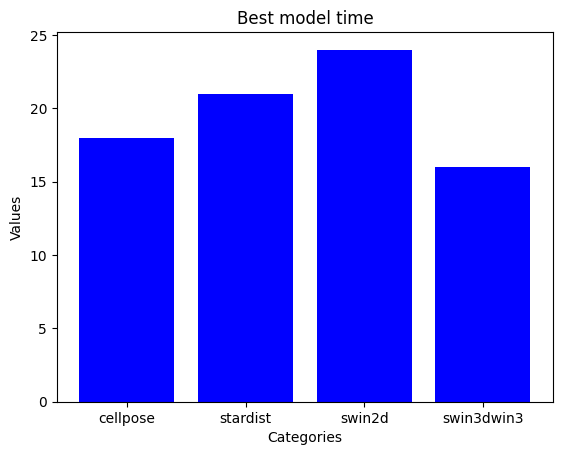

In [242]:
###win time plot

import matplotlib.pyplot as plt

# Example data
categories = ['cellpose', 'stardist', 'swin2d', 'swin3dwin3']
values = [cellpose_win, stardist_win+2, swin2d_win+1, swin3d_win]

# Creating the bar plot
plt.bar(categories, values, color='blue')

# Adding titles and labels
plt.title('Best model time')
plt.xlabel('Categories')
plt.ylabel('Values')

# Display the plot
plt.show()



In [226]:
swin3d_win

16

In [208]:
rank_worst_ori = {}

In [209]:
for img_id in rank_worst:
    rank_worst_ori[img_id] =  [models_name[shuffle_model[img_id][item-1]] for item in rank_worst[img_id]]

In [210]:
rank_worst_ori

{'0033': ['cellpose'],
 '0046': ['stardist'],
 '0063': ['stardist'],
 '0146': ['swin_3d_pretrain_win3', 'cellpose', 'stardist', 'swin2d'],
 '0147': ['cellpose', 'swin2d', 'stardist', 'swin_3d_pretrain_win3'],
 '0227': ['stardist', 'swin_3d_pretrain_win3', 'cellpose', 'swin2d'],
 '0246': ['swin_3d_pretrain_win3'],
 '0279': ['stardist']}

In [232]:
cellpose_lose = 0
stardist_lose = 0
swin2d_lose = 0
swin3d_lose = 0
for item in rank_worst_ori:
    if 'cellpose' in rank_worst_ori[item]:
        cellpose_lose += 1
    if 'stardist' in rank_worst_ori[item]:
        stardist_lose += 1
    if 'swin2d' in rank_worst_ori[item]:
        swin2d_lose += 1
    if 'swin_3d_pretrain_win3' in rank_worst_ori[item]:
       
        swin3d_lose += 1
    

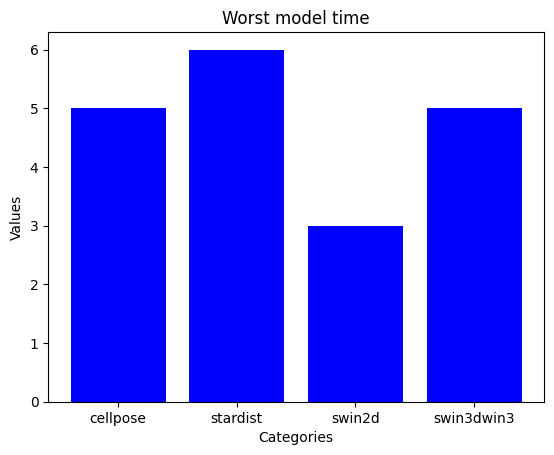

In [243]:

###lose time plot

import matplotlib.pyplot as plt

# Example data
categories = ['cellpose', 'stardist', 'swin2d', 'swin3dwin3']
values = [cellpose_lose+1, stardist_lose, swin2d_lose, swin3d_lose+1]

# Creating the bar plot
plt.bar(categories, values, color='blue')

# Adding titles and labels
plt.title('Worst model time')
plt.xlabel('Categories')
plt.ylabel('Values')

# Display the plot
plt.show()



In [120]:
rank_comment

{'0056': 'None performed well. If I have to choose, model 2 or 4 is the best.',
 '0113': 'maybe 2 better',
 '0159': 'model1 but it still missed a lot of dim cells',
 '0176': 'Hard to rank. Model 5 may be the best?',
 '0227': 'model1 best, but it is poor',
 '0238': 'But not excellent'}

In [121]:
rank_NA

{'0109': 'NA', '0118': 'NA', '0221': 'NA'}

In [211]:
rank_rank

{'0079': [1, 3, 4, 2], '0090': [3, 4], '0275': [4, 2]}

In [215]:
rank_rank_ori = {}
for img_id in rank_rank:
    rank_rank_ori[img_id] =  [models_name[shuffle_model[img_id][item-1]] for item in rank_rank[img_id]]

In [217]:
rank = rank_rank_ori 

In [218]:
rank

{'0079': ['swin2d', 'swin_3d_pretrain_win3', 'stardist', 'cellpose'],
 '0090': ['stardist', 'swin2d'],
 '0275': ['stardist', 'swin_3d_pretrain_win3']}

In [126]:
shuffle_model['0005'].index(1)

2

In [138]:
shuffle_model['0005']

[2, 4, 1, 3]

In [131]:
import matplotlib.pyplot as plt 
# Create a PdfPages object to save the figures
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('model_ori_order.pdf') as pdf:
   for img_id in test_id:

        if img_id in rank_best_ori:
            
        model_img = [ tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model1.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model2.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model3.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model4.tif')]
        
        
         
        model_ori1 = cellpose_data[img_id]
        model_ori2 = stardist_data[img_id]
        model_ori3 = swin2d_predict[img_id]
        model_ori4 = swin_3D_pretrain_window3_predict[img_id]

        ##### change order
        cellpose = model_img[shuffle_model[img_id].index(1)]
        stardist = model_img[shuffle_model[img_id].index(2)]
        swin2d = model_img[shuffle_model[img_id].index(3)]
        swin3d_win3 = model_img[shuffle_model[img_id].index(4)]
        
        fig, ax = plt.subplots(2, 4, figsize=(20, 10))
        
        # Display the images
        ax[0][0].imshow(cellpose>0)
        ax[0][1].imshow(stardist>0)
        ax[0][2].imshow(swin2d>0)
        ax[0][3].imshow(swin3d_win3>0)

        ax[1][0].imshow(model_ori1)
        ax[1][1].imshow(model_ori2)
        ax[1][2].imshow(model_ori3)
        ax[1][3].imshow(model_ori4)
       
        # Set titles for each subplot
        ax[0][0].set_title(f'{img_id} cellpose ')
        ax[0][1].set_title(f'{img_id} stardist')
        ax[0][2].set_title(f'{img_id} swin2d')
        ax[0][3].set_title(f'{img_id} swin3d_win3')
        # Adjust layout
        plt.tight_layout()
        
        # Save the current figure into the PDF
        pdf.savefig(fig)
        
        # Close the figure to free memory
        plt.close(fig)

print("PDF saved successfully.")


PDF saved successfully.


In [ ]:


    3:swin2d_predict,
    4:swin_3D_pretrain_window3_predict


/tmp/ipykernel_421104/3226394645.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 4, figsize=(20, 10))


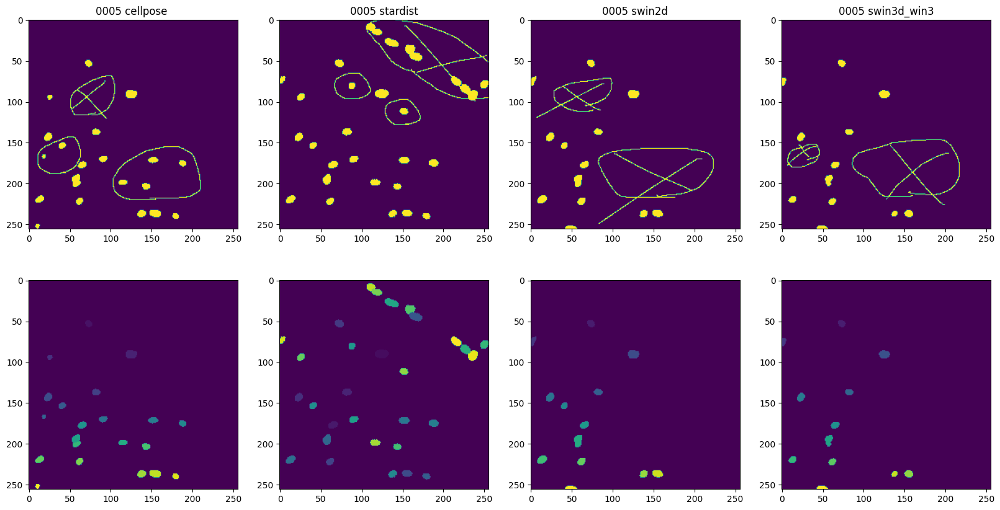

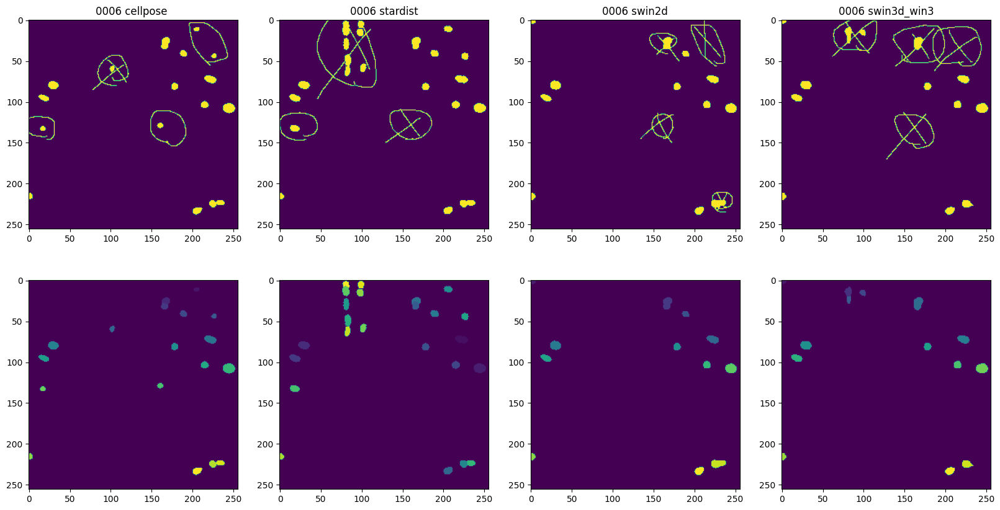

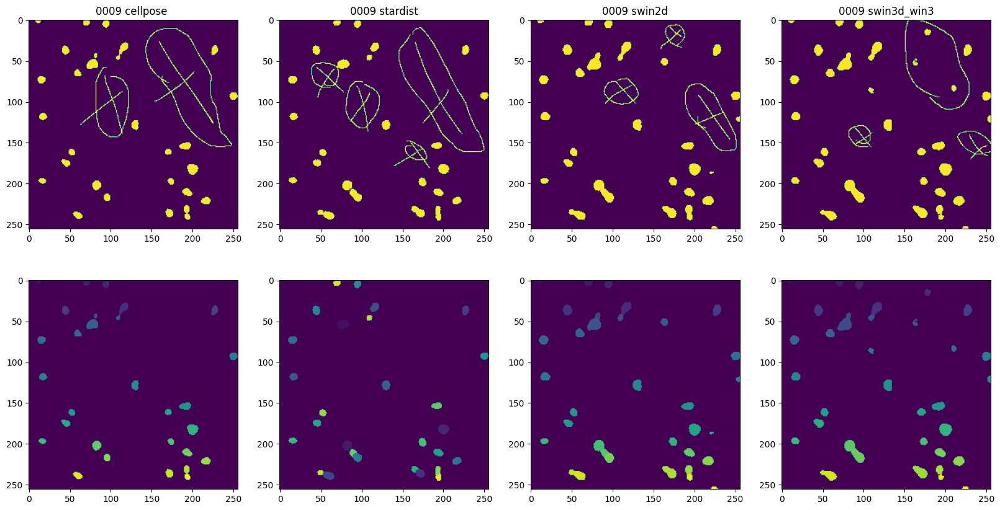

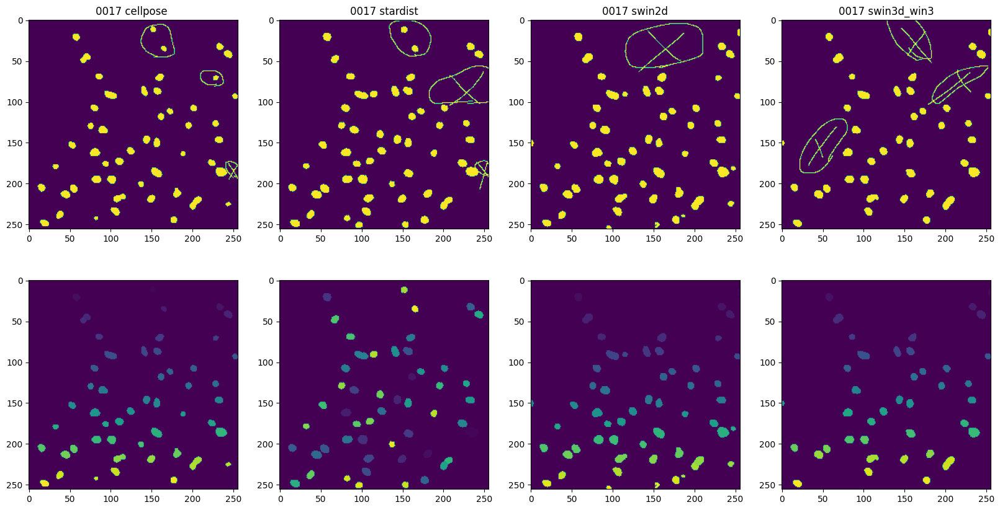

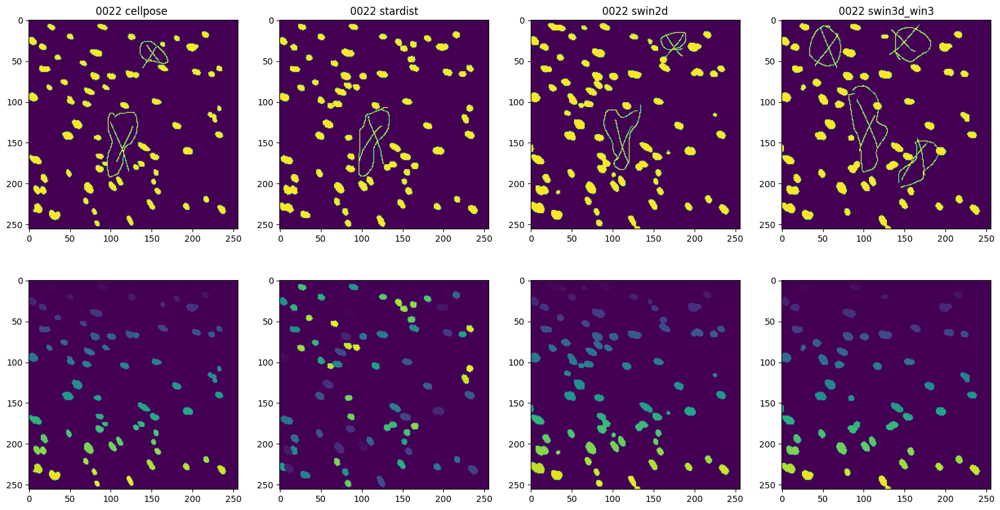

...

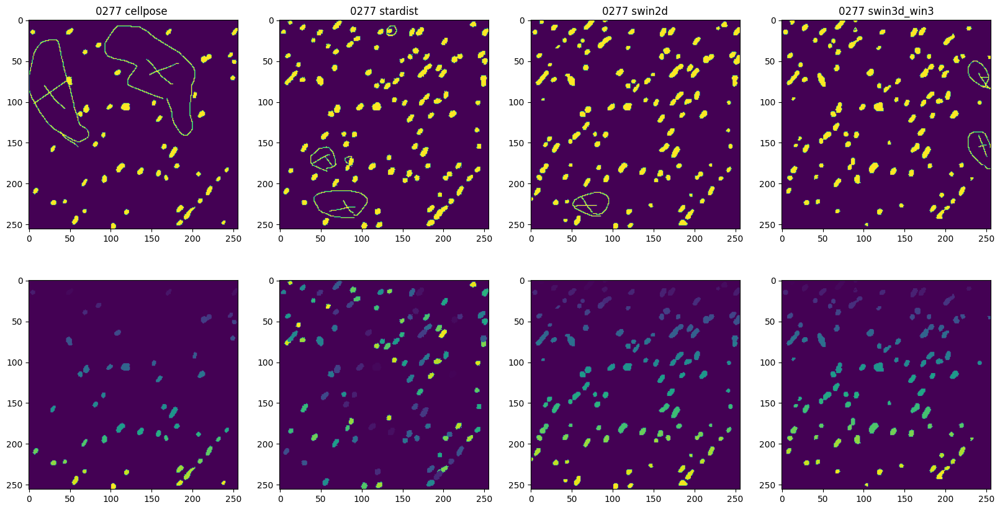

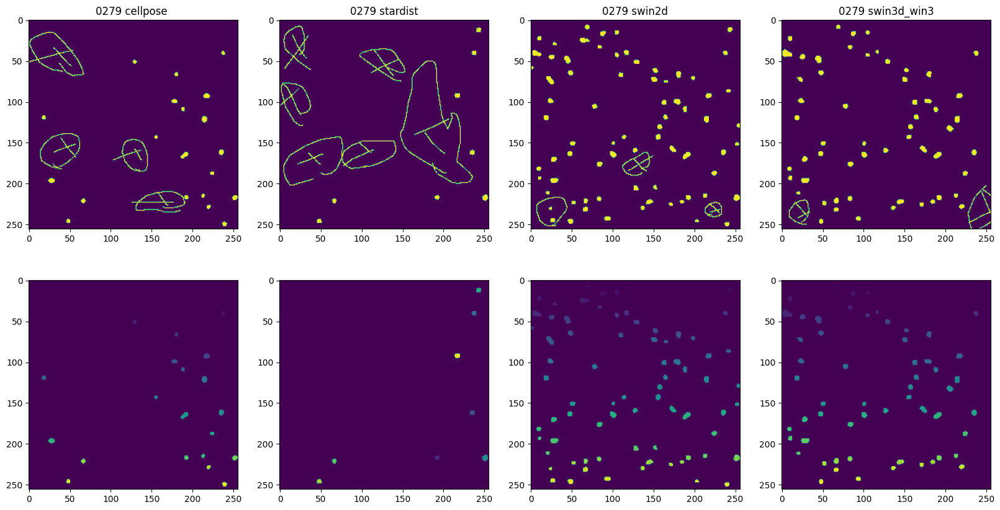

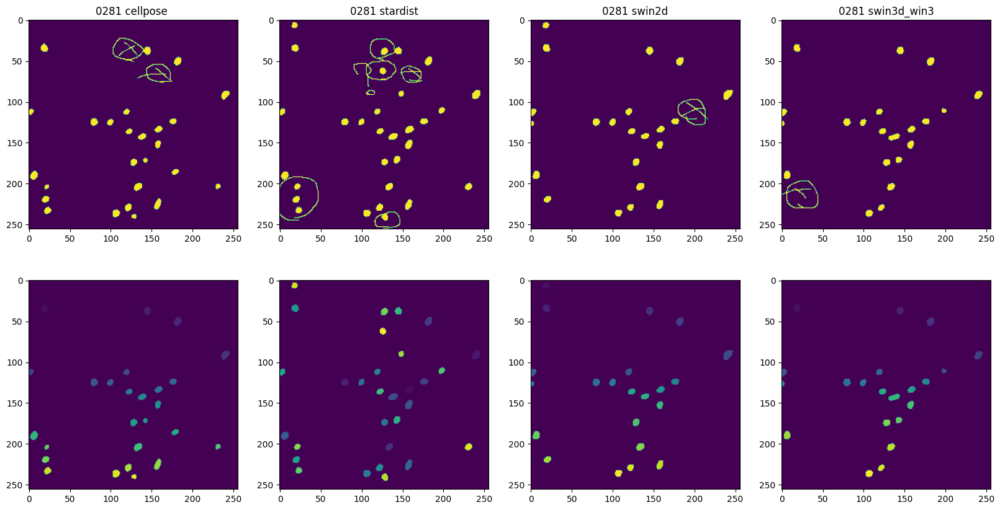

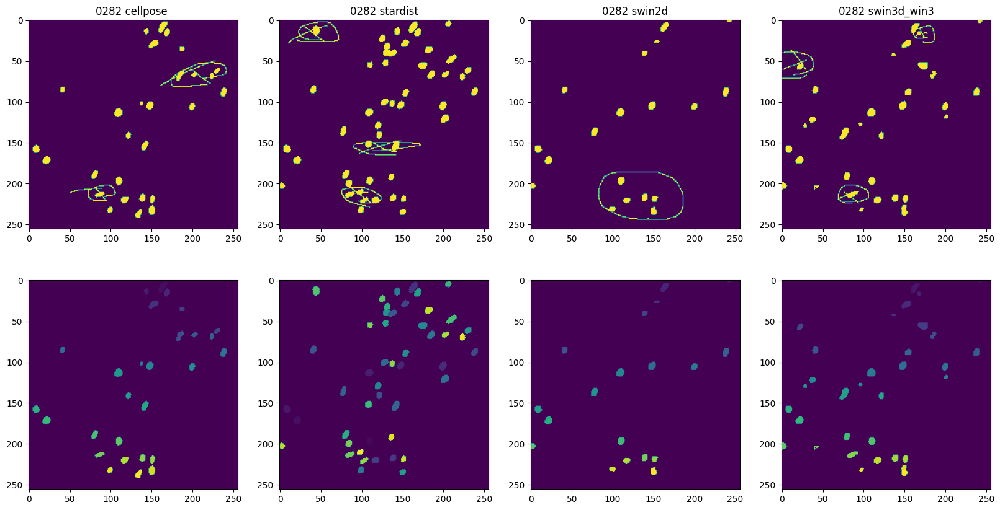

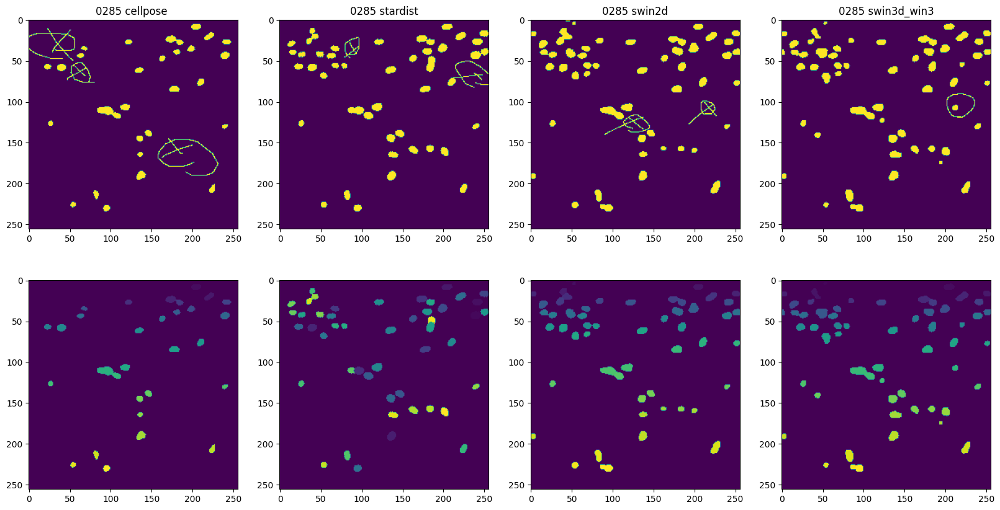

In [129]:
 for img_id in test_id[]:
        
        model_img = [ tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model1.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model2.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model3.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model4.tif')]
        
        _
         
        model_ori1 = cellpose_data[img_id]
        model_ori2 = stardist_data[img_id]
        model_ori3 = swin2d_predict[img_id]
        model_ori4 = swin_3D_pretrain_window3_predict[img_id]

        ##### change order
        cellpose = model_img[shuffle_model[img_id].index(1)]
        stardist = model_img[shuffle_model[img_id].index(2)]
        swin2d = model_img[shuffle_model[img_id].index(3)]
        swin3d_win3 = model_img[shuffle_model[img_id].index(4)]
        
        fig, ax = plt.subplots(2, 4, figsize=(20, 10))
        
        # Display the images
        ax[0][0].imshow(cellpose>0)
        ax[0][1].imshow(stardist>0)
        ax[0][2].imshow(swin2d>0)
        ax[0][3].imshow(swin3d_win3>0)

        ax[1][0].imshow(model_ori1)
        ax[1][1].imshow(model_ori2)
        ax[1][2].imshow(model_ori3)
        ax[1][3].imshow(model_ori4)
       
        # Set titles for each subplot
        ax[0][0].set_title(f'{img_id} cellpose ')
        ax[0][1].set_title(f'{img_id} stardist')
        ax[0][2].set_title(f'{img_id} swin2d')
        ax[0][3].set_title(f'{img_id} swin3d_win3')

In [241]:
import matplotlib.pyplot as plt 
# Create a PdfPages object to save the figures
from matplotlib.backends.backend_pdf import PdfPages
with PdfPages('model_masks.pdf') as pdf:
   for img_id in test_id:
            
        model_img = [ tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model1.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model2.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model3.tif'),
                      tf.imread(f'/mnt/aperto/mxia/Tatz_annotations/models_select/{img_id}_model4.tif')]
        
        mask = tf.imread(f'/mnt/aperto/yin/cellpose_training/data/test/{img_id}_mask.tif')

        ##### change order
        cellpose = model_img[shuffle_model[img_id].index(1)]
        stardist = model_img[shuffle_model[img_id].index(2)]
        swin2d = model_img[shuffle_model[img_id].index(3)]
        swin3d_win3 = model_img[shuffle_model[img_id].index(4)]
        
        fig, ax = plt.subplots(1, 5, figsize=(25, 5))
        
        # Display the images
        ax[0].imshow(cellpose>0)
        ax[1].imshow(stardist>0)
        ax[2].imshow(swin2d>0)
        ax[3].imshow(swin3d_win3>0)
        ax[4].imshow(mask>0)

       
        # Set titles for each subplot
        ax[0].set_title(f'{img_id} cellpose ')
        ax[1].set_title(f'{img_id} stardist')
        ax[2].set_title(f'{img_id} swin2d')
        ax[3].set_title(f'{img_id} swin3d_win3')
        ax[4].set_title(f'{img_id} Yuchen annotate')
        # Adjust layout
        plt.tight_layout()
        
        # Save the current figure into the PDF
        pdf.savefig(fig)
        
        # Close the figure to free memory
        plt.close(fig)

print("PDF saved successfully.")

PDF saved successfully.


In [398]:
test_id

['0005',
 '0006',
 '0009',
 '0017',
 '0022',
 '0024',
 '0030',
 '0033',
 '0042',
 '0045',
 '0046',
 '0056',
 '0059',
 '0060',
 '0063',
 '0066',
 '0075',
 '0077',
 '0079',
 '0084',
 '0090',
 '0101',
 '0109',
 '0113',
 '0117',
 '0118',
 '0119',
 '0124',
 '0125',
 '0143',
 '0146',
 '0147',
 '0158',
 '0159',
 '0165',
 '0168',
 '0172',
 '0176',
 '0177',
 '0181',
 '0183',
 '0202',
 '0213',
 '0221',
 '0227',
 '0231',
 '0238',
 '0244',
 '0246',
 '0260',
 '0269',
 '0271',
 '0274',
 '0275',
 '0277',
 '0279',
 '0281',
 '0282',
 '0285']

In [399]:
test_idx = ['0005', '0006', '0009', '0017', '0022', '0024', '0030', '0033',
       '0042', '0045', '0046', '0056', '0059', '0060', '0063', '0066',
       '0075', '0077', '0079', '0084', '0090', '0101', '0109', '0113',
       '0117', '0118', '0119', '0124', '0125', '0143', '0146', '0147',
       '0158', '0159', '0165', '0168', '0172', '0176', '0177', '0181',
       '0183', '0202', '0213', '0221', '0227', '0231', '0238', '0244',
       '0246', '0260', '0269', '0271', '0274', '0275', '0277', '0279',
       '0281', '0282', '0285']

In [401]:
len(test_idx)

59

In [404]:
for item in test_idx:
    if item not in test_id:
        print(item)

In [405]:
len(test_id)

59